# Image Denoising with Auto Encoder_Decoder

## Group Members

* Usama Shafique (364871)
* Zainab Zaman   (362458)

## Importing Libraries

In [1]:
import os
import numpy as np
import cv2

## Load the data with Kaggle API

In [4]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle/
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [5]:
! kaggle datasets download -d karakaggle/kaggle-cat-vs-dog-dataset

 98% 770M/787M [00:05<00:00, 139MB/s]
100% 787M/787M [00:05<00:00, 156MB/s]


### Extract Zip File

In [2]:
import zipfile

# Unzip the archive
local_zip = '/content/kaggle-cat-vs-dog-dataset.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall()

zip_ref.close()

In [3]:
# Selecting Dog Directory to be used in this notebook
import os
dogDir = '/content/kagglecatsanddogs_3367a/PetImages/Dog'
print("Total Dog Images:", len(os.listdir(dogDir)))

Total Dog Images: 12470


### Selecting 1500 Images to be used here

In [4]:
# Copy the directory with file names in a list for 1500
dogImageFile = []
for i, file in zip(range(1500), os.listdir(dogDir)):
  dogImageFile.append(os.path.join(dogDir, file))

In [5]:
# In the data we might have some corrupted files so before processing they need to be removed
cleanFiles = []
for file in dogImageFile:
  if os.path.getsize(file) > 100:
    cleanFiles.append(file)
print("Before processing total files:", len(dogImageFile))
print("After processign total files:", len(cleanFiles))

Before processing total files: 1500
After processign total files: 1500


## Plot some sample Images

In [13]:
import matplotlib.pyplot as plt 

### Preprocess and Add noise to data

In [6]:
# prepare function
def process_image(img):
    img = cv2.resize(img, (300, 300)) # Resize image according to given size
    img = img/255.0                   # Normalize Image take it in 0-1 range
    img = np.asarray(img, dtype="float32")  # Conver image into array with type float32
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    noise_factor = 0.3
    noisy_array = img + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=img.shape
    )                                  # Add noise to image and save it as new image
    
    return img,np.clip(noisy_array, 0.0, 1.0) # Clip values in 0-1 only

In [7]:
processedImageX = [] # Store Noisy images
processedImageY = [] # Store original resized image
for f, num in zip(cleanFiles, range(len(cleanFiles))):
  print("Remaining:",(len(cleanFiles)-num))
  img = cv2.imread(f)            # Read Image
  try:
    len(img)
    imgY, imgX = process_image(img)
    processedImageX.append(imgX)
    processedImageY.append(imgY)
  except TypeError:
    pass


Remaining: 1500
Remaining: 1499
Remaining: 1498
Remaining: 1497
Remaining: 1496
Remaining: 1495
Remaining: 1494
Remaining: 1493
Remaining: 1492
Remaining: 1491
Remaining: 1490
Remaining: 1489
Remaining: 1488
Remaining: 1487
Remaining: 1486
Remaining: 1485
Remaining: 1484
Remaining: 1483
Remaining: 1482
Remaining: 1481
Remaining: 1480
Remaining: 1479
Remaining: 1478
Remaining: 1477
Remaining: 1476
Remaining: 1475
Remaining: 1474
Remaining: 1473
Remaining: 1472
Remaining: 1471
Remaining: 1470
Remaining: 1469
Remaining: 1468
Remaining: 1467
Remaining: 1466
Remaining: 1465
Remaining: 1464
Remaining: 1463
Remaining: 1462
Remaining: 1461
Remaining: 1460
Remaining: 1459
Remaining: 1458
Remaining: 1457
Remaining: 1456
Remaining: 1455
Remaining: 1454
Remaining: 1453
Remaining: 1452
Remaining: 1451
Remaining: 1450
Remaining: 1449
Remaining: 1448
Remaining: 1447
Remaining: 1446
Remaining: 1445
Remaining: 1444
Remaining: 1443
Remaining: 1442
Remaining: 1441
Remaining: 1440
Remaining: 1439
Remainin

### Plot some sample images

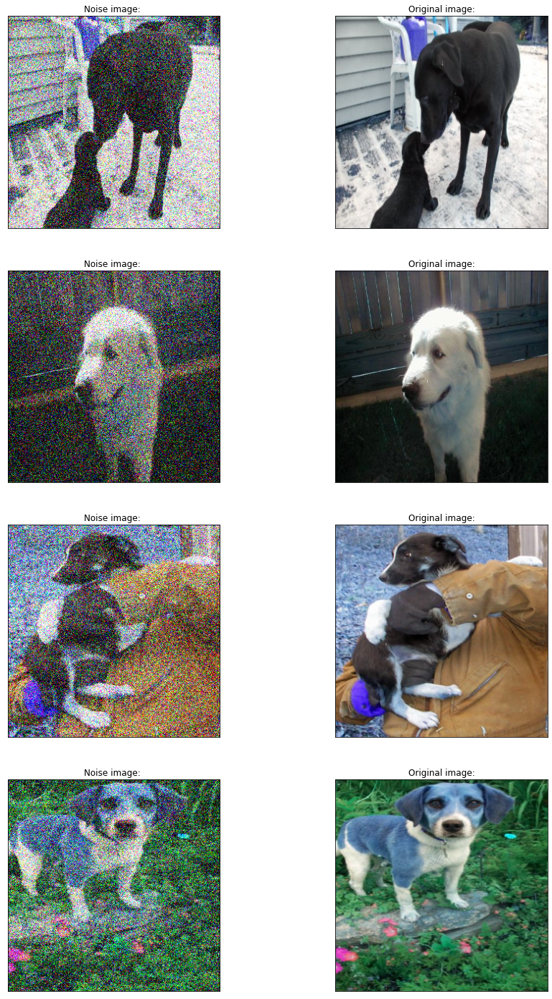

In [13]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(processedImageX[i][:,:])
    plt.title('Noise image: ')
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(processedImageY[i][:,:])
    plt.title('Original image:')

plt.show()

In [8]:
# convert list to numpy array
processedImageX = np.asarray(processedImageX).reshape(-1, 300, 300, 3)
processedImageY = np.asarray(processedImageY).reshape(-1, 300, 300, 3)

In [9]:
processedImageX.shape

(1498, 300, 300, 3)

## Split Data into Training and Testing

In [10]:
from sklearn.model_selection import train_test_split

In [11]:
# Use 20% data for testing the model
trainNoise, testNoise, trainOriginal, testOriginal = train_test_split(processedImageX, processedImageY, test_size=0.2)


## Delete previous used variables to free space

In [12]:
%reset_selective -f "^processedImageX$"
%reset_selective -f "^processedImageY$"


### Plot training and test samples

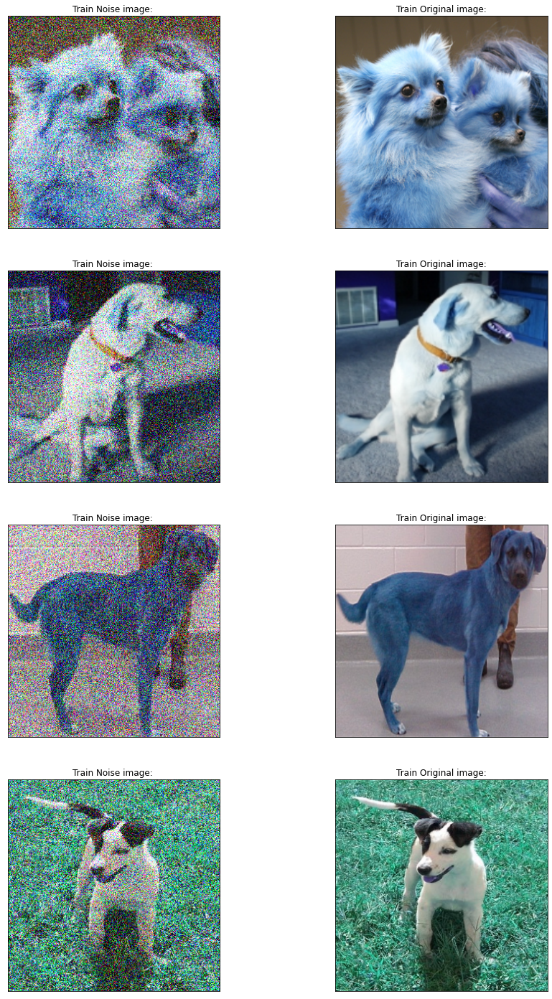

In [18]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(trainNoise[i][:,:])
    plt.title('Train Noise image: ')
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(trainOriginal[i][:,:])
    plt.title('Train Original image:')

plt.show()

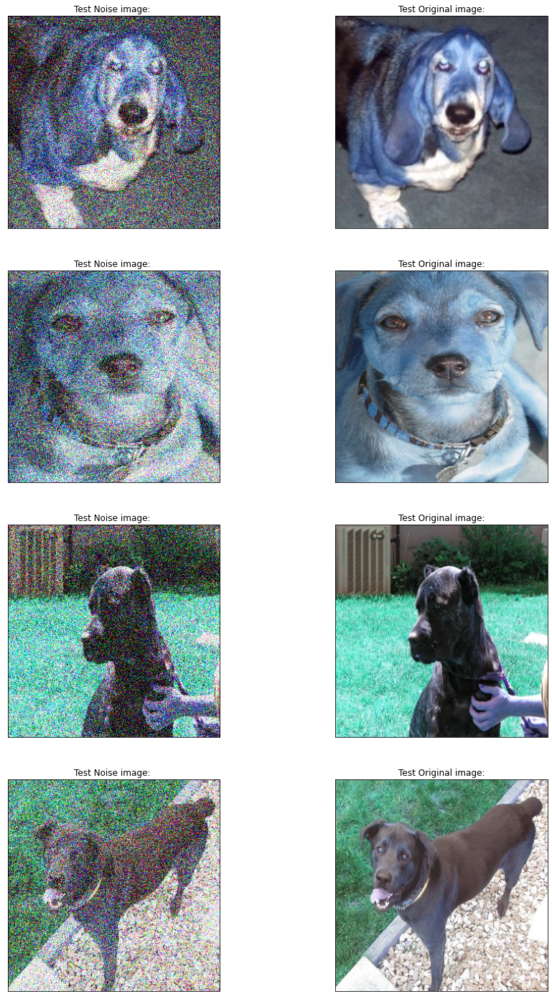

In [20]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(testNoise[i][:,:])
    plt.title('Test Noise image: ')
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(testOriginal[i][:,:])
    plt.title('Test Original image:')

plt.show()

## Build Encoder/Decoder Model

In [14]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Input, Conv2D, UpSampling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping

In [15]:
def createModel():
  # This function will create Auto Encoder/Decoder model
  x = Input(shape=(300, 300, 3)) 

  # Encoder
  encCovLayer1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
  poolingLayer1 = MaxPooling2D((2, 2), padding='same')(encCovLayer1)
  batchnormLayer1 = BatchNormalization()(poolingLayer1)
  encCovLayer2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnormLayer1)
  poolingLayer2 = MaxPooling2D((2, 2), padding='same')(encCovLayer2)
  batchnormLayer2 = BatchNormalization()(poolingLayer2)
  encCovLayer3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnormLayer2)
  poolingLayer3 = MaxPooling2D((2, 2), padding='same')(encCovLayer3)


  # Decoder
  decCovLayer1 = Conv2D(64, (3, 3), activation='relu', padding='same')(poolingLayer3)
  upSampleLayer1 = UpSampling2D((2, 2))(decCovLayer1)
  decCovLayer2 = Conv2D(32, (3, 3), activation='relu', padding='same')(upSampleLayer1)
  upSampleLayer2 = UpSampling2D((2, 2))(decCovLayer2)
  decCovLayer3 = Conv2D(16, (3, 3), activation='relu')(upSampleLayer2)
  upSampleLayer3 = UpSampling2D((2, 2))(decCovLayer3)
  r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(upSampleLayer3)

  model = Model(x, r)
  model.compile(optimizer='adam', loss='mse')
  return model

In [16]:
encDecModel = createModel()

In [17]:
encDecModel.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 150, 150, 64)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 64)     256       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 75, 75, 32)       0     

In [18]:
earlyStopCallback = EarlyStopping(monitor='loss', patience=5)
history = encDecModel.fit(trainNoise, trainOriginal, epochs=200, batch_size=64, validation_data=(testNoise, testOriginal), validation_batch_size=32, callbacks=[earlyStopCallback])

Epoch 1/200
19/19 [==============================] - 30s 793ms/step - loss: 0.0277 - val_loss: 0.0609
Epoch 2/200
19/19 [==============================] - 8s 425ms/step - loss: 0.0118 - val_loss: 0.0533
Epoch 3/200
19/19 [==============================] - 8s 428ms/step - loss: 0.0100 - val_loss: 0.0518
Epoch 4/200
19/19 [==============================] - 8s 428ms/step - loss: 0.0095 - val_loss: 0.0502
Epoch 5/200
19/19 [==============================] - 8s 431ms/step - loss: 0.0082 - val_loss: 0.0520
Epoch 6/200
19/19 [==============================] - 8s 434ms/step - loss: 0.0078 - val_loss: 0.0473
Epoch 7/200
19/19 [==============================] - 8s 433ms/step - loss: 0.0074 - val_loss: 0.0468
Epoch 8/200
19/19 [==============================] - 8s 437ms/step - loss: 0.0067 - val_loss: 0.0429
Epoch 9/200
19/19 [==============================] - 8s 449ms/step - loss: 0.0066 - val_loss: 0.0425
Epoch 10/200
19/19 [==============================] - 8s 441ms/step - loss: 0.0069 - val_l

## Visualizing output results of layers

Display image: 0
Display image: 1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in true_divide


Display image: 2
Display image: 3


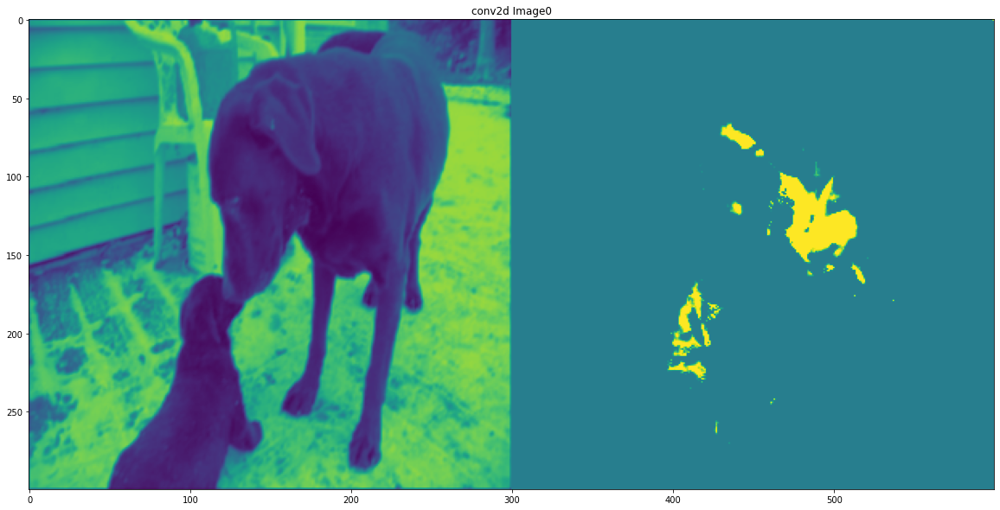

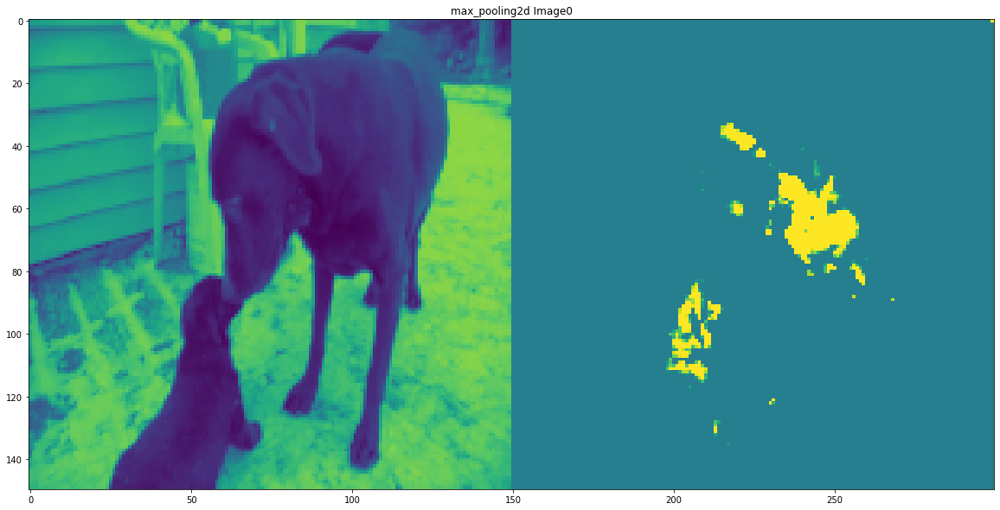

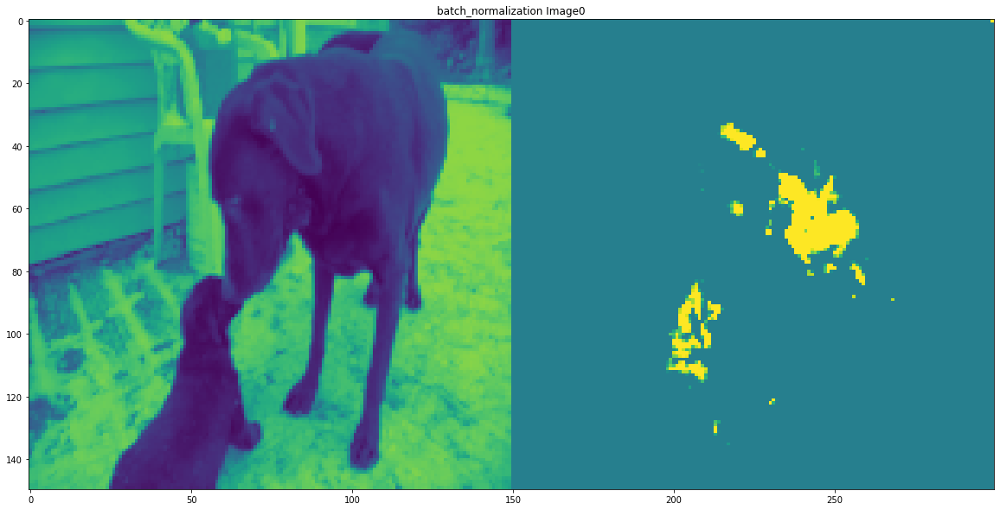

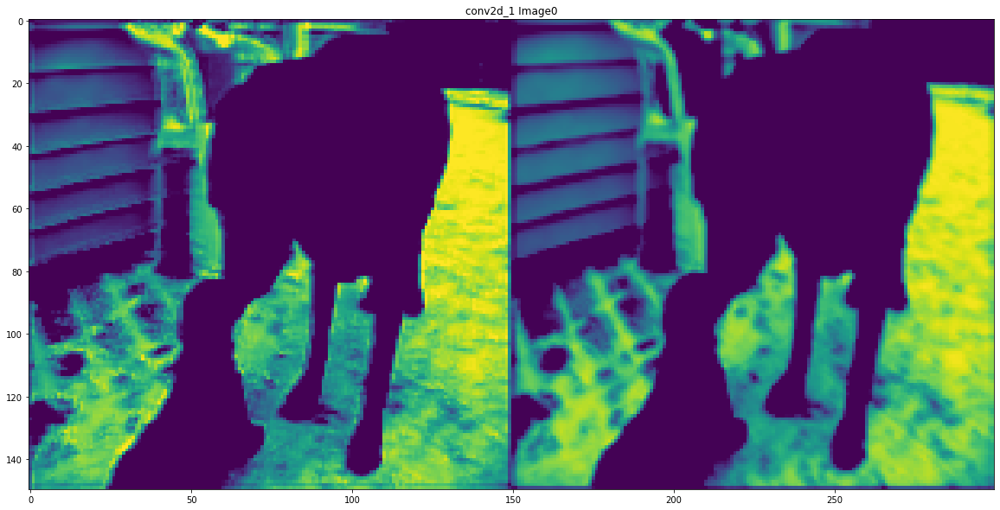

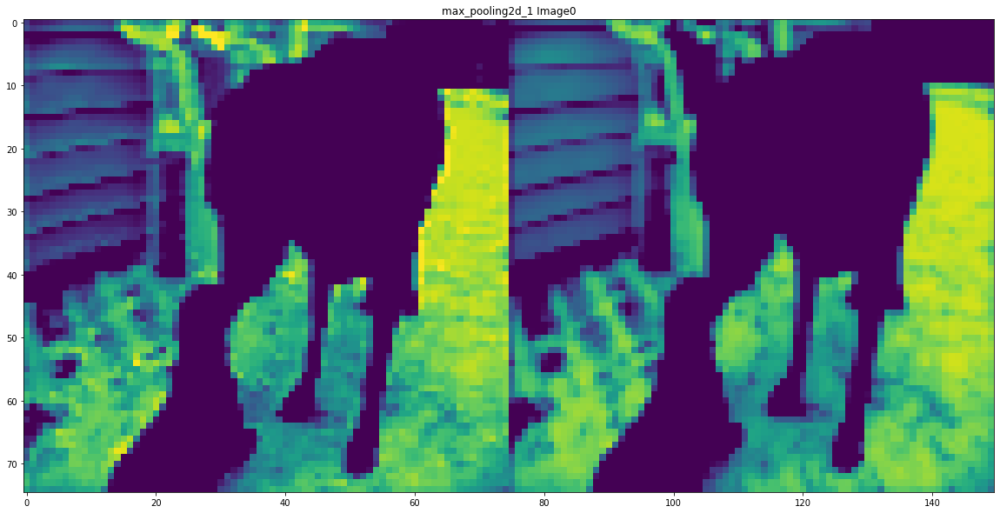

...

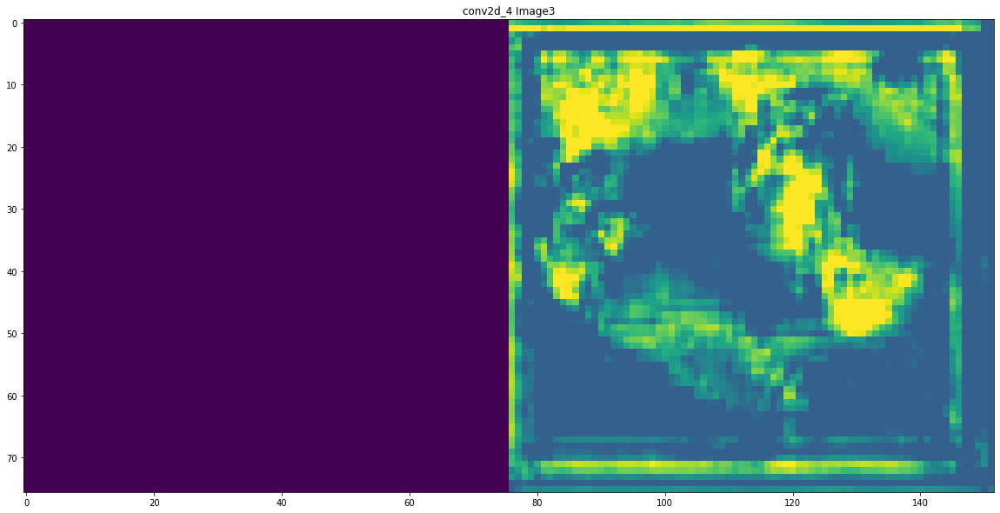

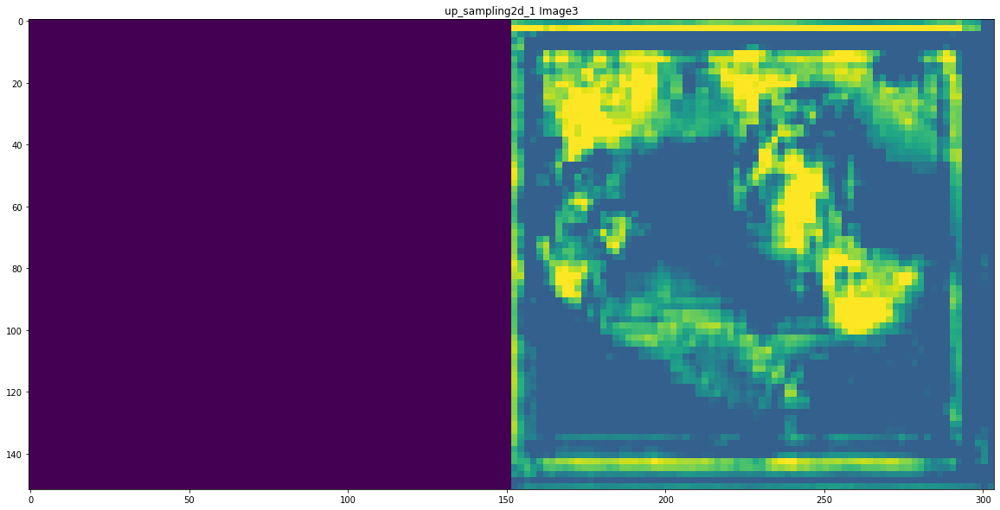

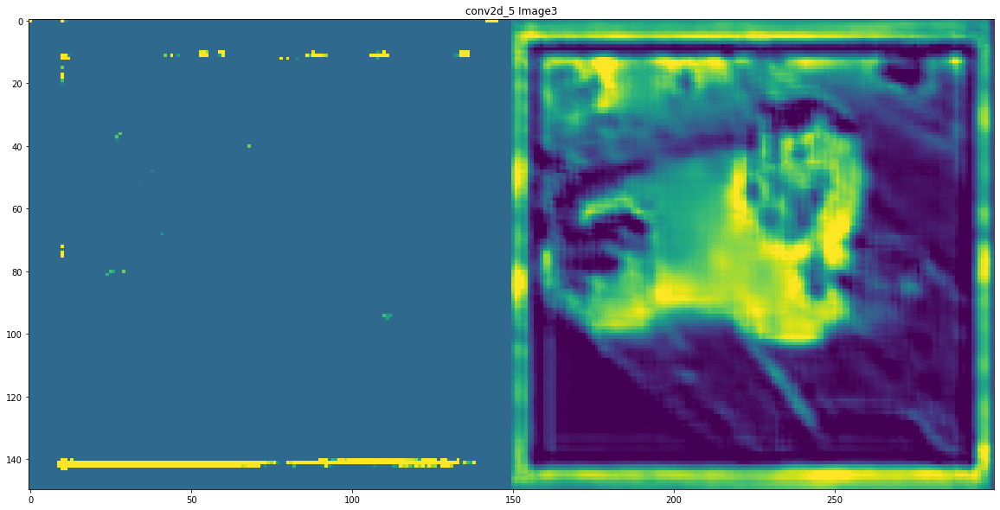

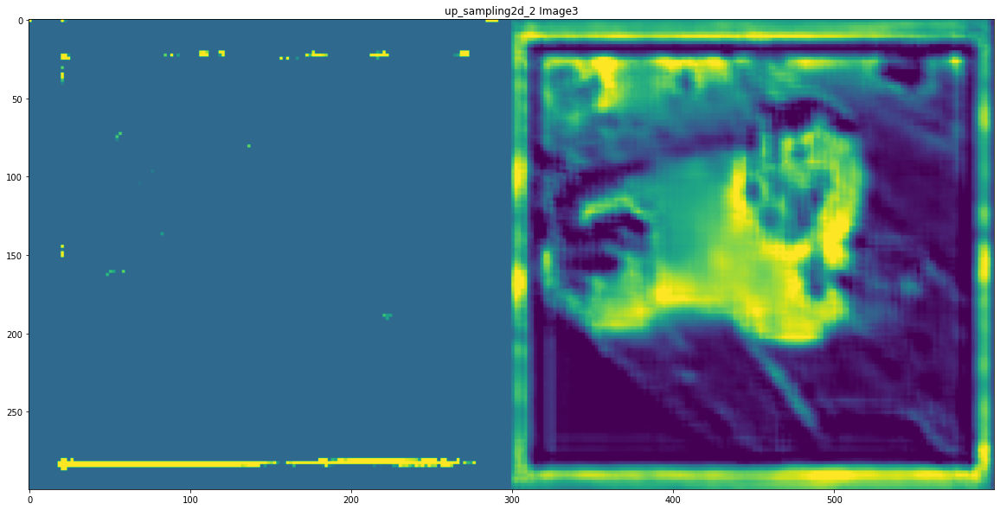

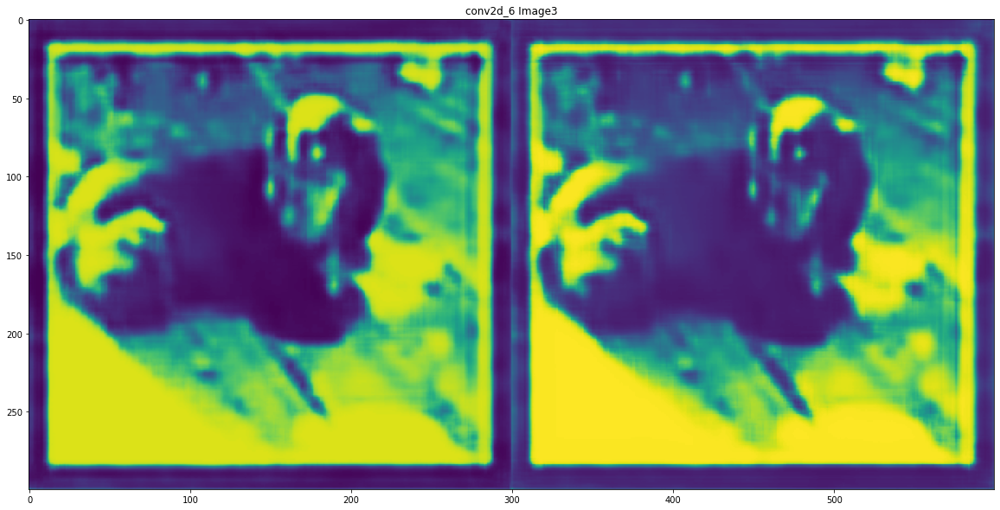

In [23]:
import numpy as np
import random
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.

# Change model name here with modelname.layers[1:]
successive_outputs = [layer.output for layer in encDecModel.layers[1:]]

# Change model.input with your modelname.input
visualization_model = tf.keras.models.Model(inputs = encDecModel.input, outputs = successive_outputs)

# Test Directory path change this with your directory path

for i in range(4): # Display 4 images
  print("Display image:",i)
  # Prepare a random input image from the training set.
  
  img_path = cleanFiles[i] # Copy path of image
  currentImage = " Image" + str(i)
  img = load_img(img_path, target_size=(300, 300))  # this is a PIL image
  x = img_to_array(img)  # Numpy array with shape (300, 300, 3)
  x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 300, 300, 3)

  # Scale by 1/255
  x /= 255

  # Run the image through the network, thus obtaining all
  # intermediate representations for this image.
  successive_feature_maps = visualization_model.predict(x)

  # These are the names of the layers , so you can have them as part of the plot
  layer_names = [layer.name for layer in encDecModel.layers[1:]]

  # Display the representations
  for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    # if layer_name.startswith("conv2d"):
    if len(feature_map.shape) == 4:

      # Just do this for the conv / maxpool layers, not the fully-connected layers
      n_features = feature_map.shape[-1]  # number of features in feature map

      # The feature map has shape (1, size, size, n_features)
      size = feature_map.shape[1]

      # Tile the images in this matrix
      display_grid = np.zeros((size, size * 2))
      for i in range(2):
        x = feature_map[0, :, :, i]
        x -= x.mean()
        x /= x.std()
        x *= 64
        x += 128
        x = np.clip(x, 0, 255).astype('uint8')
      
        # Tile each filter into this big horizontal grid
        display_grid[:, i * size : (i + 1) * size] = x
      
      # Display the grid
      scale = 20. / 2
      plt.figure(figsize=(scale * 2, scale))
      plt.title(layer_name + currentImage)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')

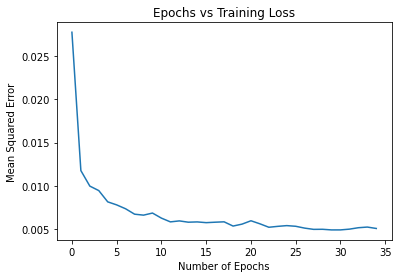

In [24]:
plt.plot(history.epoch, history.history['loss'])
plt.title('Epochs vs Training Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Mean Squared Error')
plt.show()

## Make some prediction and evaluate the Model

In [25]:
result = encDecModel.predict(testNoise)
encDecModel.evaluate(testOriginal, testNoise)

10/10 [==============================] - 1s 69ms/step - loss: 0.0903


0.09030725061893463

## Display the predicted Results

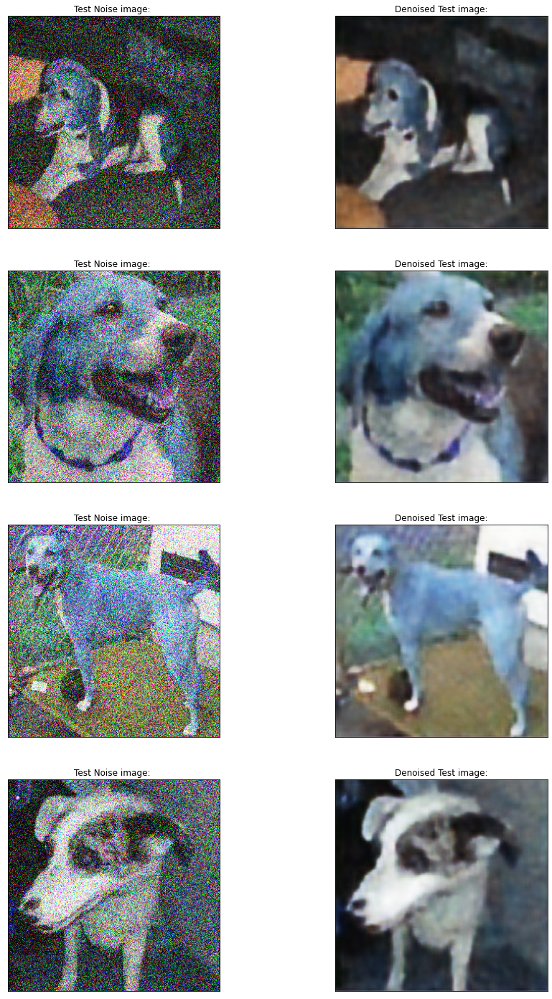

In [26]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(testNoise[i][:,:])
    plt.title('Test Noise image: ')
    
    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(result[i][:,:])
    plt.title('Denoised Test image:')

plt.show()

## Save the Model as TfLite

In [27]:
import tensorflow as tf

In [28]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_keras_model(encDecModel)
tflite_model = converter.convert()

# Save the model.
with open('model.tflite', 'wb') as f:
  f.write(tflite_model)
print("Model Saved")

INFO:tensorflow:Assets written to: /tmp/tmpqabm75z7/assets


Model Saved


## Save model as h5

In [29]:
encDecModel.save('imageDenoise.h5')